In [1]:
import os
import sys
import random

from tqdm import tqdm

from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.filters import threshold_minimum
from skimage.transform import resize

import numpy as np
import pandas as pd

from pycocotools.coco import COCO
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# Set some parameters
IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 3

seed = 42
random.seed = seed
np.random.seed = seed

In [3]:
image_dir = 'airplane/airplane_images/airplane_images_train2017_lean'
ann_dir = 'airplane/airplane_annotations/instances_train2017.json'

In [4]:
image_dir_val = 'airplane/airplane_images/airplane_images_val2017_lean'
ann_dir_val = 'airplane/airplane_annotations/instances_val2017.json'

In [5]:
# initialize COCO api for train instance annotations
coco=COCO(ann_dir)

loading annotations into memory...
Done (t=17.92s)
creating index...
index created!


In [6]:
# initialize COCO api for validation instance annotations
coco_val=COCO(ann_dir_val)

loading annotations into memory...
Done (t=0.61s)
creating index...
index created!


### Train-test-split

In [7]:
from sklearn.model_selection import train_test_split

In [8]:
images = os.listdir(image_dir)
# Split the images by 70% training, 30% testing
images_train, images_test = train_test_split(images, test_size = 0.3, random_state = seed)
# Add validation images to the test set
images_val = os.listdir(image_dir_val)
# images_test.extend(images_val)
# In total, there are around 2000 images for training, 1000 for testing
print(len(images_train))
print(len(images_test))

1511
648


In [9]:
air = coco.getCatIds(catNms='airplane')
air

[5]

In [10]:
def get_image_id(filename):
    return int(filename.split('.')[0].lstrip('0'))

In [11]:
def get_image_data(directory, filename):
    return imread(directory +'/' +filename)

In [12]:
def get_image_ann(ins, directory, filename):
    _id = get_image_id(filename)
    ann_id = ins.getAnnIds(imgIds=_id, catIds=air, iscrowd=None)
    ann = ins.loadAnns(ann_id)
    return ann

In [13]:
def get_image_mask1(ins, directory, filename):
    ann = get_image_ann(ins, directory, filename)
    return list(map(ins.annToMask, ann))

In [14]:
def get_image_mask2(ins, directory, filename):
    return sum(get_image_mask1(ins, directory, filename))

In [15]:
temp = images[125]

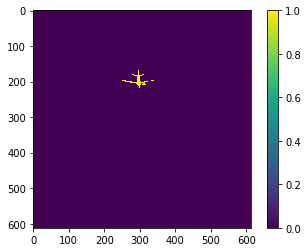

In [16]:
plt.imshow(get_image_mask2(coco,image_dir, temp))
plt.colorbar();

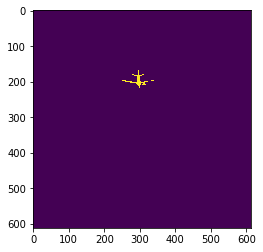

In [17]:
masks = get_image_mask1(coco, image_dir, temp)
fig=plt.figure(figsize=(4,4))
for i in range(1, len(masks)+1):
    img = masks[i-1]
    fig.add_subplot(1,len(masks), i)
    plt.imshow(img)
plt.show();

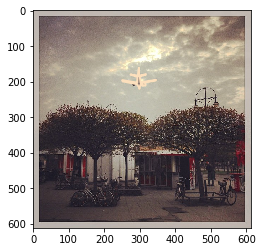

In [18]:
plt.imshow(get_image_data(image_dir, temp))
coco.showAnns(get_image_ann(coco, image_dir, temp))

In [19]:
for i in tqdm(images_train):
    try:
        get_image_id(i)
    except:
        images_train.remove(i)

100%|█████████▉| 1510/1511 [00:00<00:00, 265062.32it/s]


In [20]:
for i in tqdm(images_test):
    try:
        get_image_id(i)
    except:
        images_test.remove(i)

100%|██████████| 648/648 [00:00<00:00, 266305.02it/s]


In [21]:
for i in tqdm(images_train):
    try:
        get_image_data(image_dir, i)
    except:
        images_train.remove(i)

100%|██████████| 1510/1510 [00:13<00:00, 112.54it/s]


In [22]:
for i in tqdm(images_test):
    try:
        get_image_data(image_dir, i)
    except:
        images_test.remove(i)

100%|██████████| 648/648 [00:05<00:00, 114.79it/s]


In [23]:
train_ids = list(map(get_image_id, images_train))
test_ids = list(map(get_image_id, images_test))

# Get colored images
train_images = list(map(lambda x: get_image_data(image_dir,x), images_train))
test_images = list(map(lambda x: get_image_data(image_dir,x), images_test))

# Get all airplane masks
train_masks = list(map(lambda x: get_image_mask2(coco,image_dir,x), images_train))
test_masks = list(map(lambda x: get_image_mask2(coco,image_dir,x), images_test))

In [24]:
# Resolve overlapped masks
test_masks = list(map(lambda x: (x>0).astype(int), test_masks))
train_masks = list(map(lambda x: (x>0).astype(int), train_masks))

(array([270701.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,  36499.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

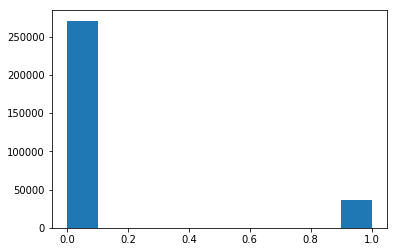

In [25]:
plt.hist(test_masks[5].flatten())

In [26]:
# check that all arrays contain only 0's and 1's
for i in range(len(test_masks)):
    vals = np.unique(np.asarray(test_masks[i]).flatten())
    if not np.array_equal(vals, np.asarray([0,1])):
        print(vals)

In [27]:
images_val = os.listdir(image_dir_val)

In [28]:
for i in tqdm(images_val):
    try:
        get_image_id(i)
    except:
        images_val.remove(i)

 99%|█████████▉| 80/81 [00:00<00:00, 87907.86it/s]


In [29]:
val_images = list(map(lambda x: get_image_data(image_dir_val,x), images_val))
val_masks = list(map(lambda x: get_image_mask2(coco_val,image_dir_val,x), images_val))
val_masks = list(map(lambda x: (x>0).astype(int), val_masks))

/home/ubuntu/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and
/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


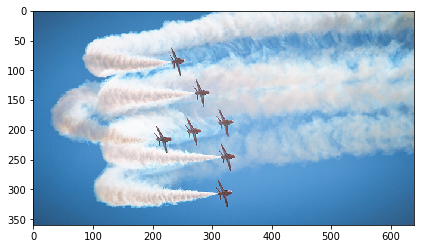

In [30]:
imshow(val_images[10]);

/home/ubuntu/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and
/home/ubuntu/anaconda3/lib/python3.6/site-packages/skimage/io/_plugins/matplotlib_plugin.py:74: UserWarning: Low image data range; displaying image with stretched contrast.
  warn("Low image data range; displaying image with "
/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


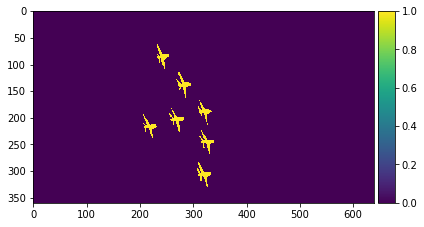

In [31]:
imshow(val_masks[10]);

In [32]:
print(len(test_images),len(test_masks),len(val_images),len(val_masks))

648 648 80 80


In [33]:
test_images.extend(val_images)
test_masks.extend(val_masks)
print(len(test_images),len(test_masks))

728 728


In [34]:
# Drop all grayscale images in train and test set
len_train = len(train_images)
color_indexs = [i for i in range(len_train) if len(train_images[i].shape) == 3]
train_images = [train_images[i] for i in tqdm(color_indexs)]
train_masks = [train_masks[i] for i in tqdm(color_indexs)]

len_test = len(test_images)
color_indexs = [i for i in range(len_test) if len(test_images[i].shape) == 3]
test_images = [test_images[i] for i in tqdm(color_indexs)]
test_masks = [test_masks[i] for i in tqdm(color_indexs)]

100%|██████████| 726/726 [00:00<00:00, 805572.67it/s]


### Image Resize

In [35]:
def resize_helper(imma):
    new_imma = resize(imma, (IMG_HEIGHT, IMG_WIDTH), mode='constant')
    return new_imma

In [36]:
X_train = list(map(resize_helper, train_images))

In [37]:
Y_train = list(map(resize_helper, train_masks))

# Convert the mask values into of 0's and 1's because the resize function 
# makes the masks into very small values
thresh_min = threshold_minimum(np.asarray(Y_train))
Y_train = np.asarray(Y_train) > thresh_min
Y_train = Y_train.astype(int)

/home/ubuntu/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from int64 to float64
  .format(dtypeobj_in, dtypeobj_out))


In [38]:
X_test = list(map(resize_helper, test_images))

In [39]:
Y_test = list(map(resize_helper, test_masks))

# Convert the mask values into of 0's and 1's because the resize function 
# makes the masks into very small values
thresh_min = threshold_minimum(np.asarray(Y_test))
Y_test = np.asarray(Y_test) > thresh_min
Y_test = Y_test.astype(int)

/home/ubuntu/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from int64 to float64
  .format(dtypeobj_in, dtypeobj_out))


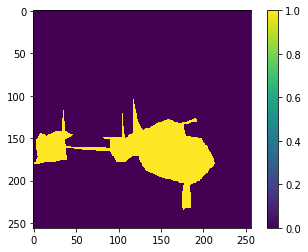

In [40]:
plt.imshow(Y_test[0])
plt.colorbar();

(array([86202662.,        0.,        0.,        0.,        0.,        0.,
               0.,        0.,        0., 11904730.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

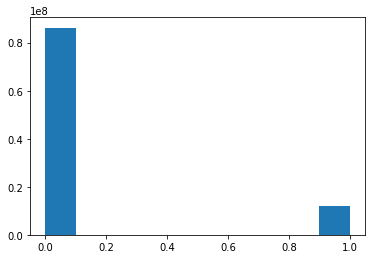

In [41]:
plt.hist(np.asarray(Y_train).flatten())

In [42]:
# check that all arrays contain only 0's and 1's
for i in range(len(Y_test)):
    vals = np.unique(np.asarray(Y_test[i]).flatten())
    if not np.array_equal(vals, np.asarray([0,1])):
        print(vals)

In [43]:
# Transform X_train, Y_train, X_test, Y_test into arrays
X_train = np.array(X_train)
Y_train = np.array(Y_train).reshape(len(Y_train), 256, 256, 1)
X_test = np.array(X_test)
Y_test = np.array(Y_test).reshape(len(Y_test), 256, 256, 1)

In [44]:
def step_check(group, show_batch = 10):    
    show_sample = random.sample(group, show_batch)
    fig=plt.figure(figsize=(32,32))
    for i in range(len(show_sample)):
        img = show_sample[i]
        fig.add_subplot(len(show_sample),1, i+1)
        plt.imshow(img)
        plt.colorbar()
    plt.show();

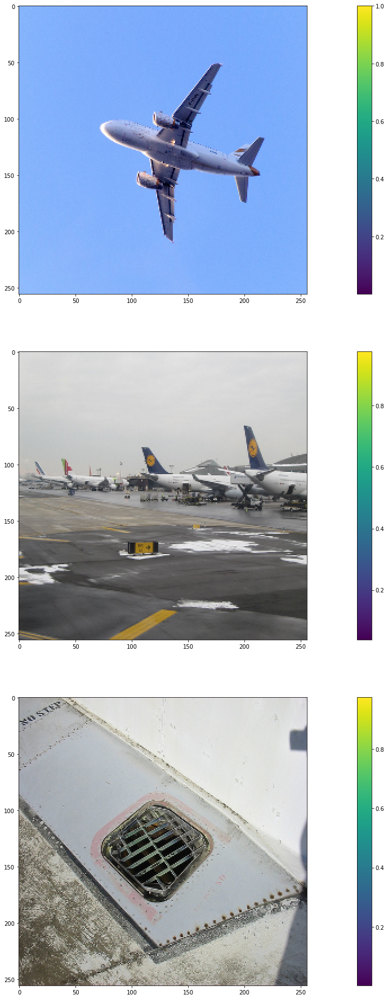

In [45]:
step_check(list(X_train), 3)

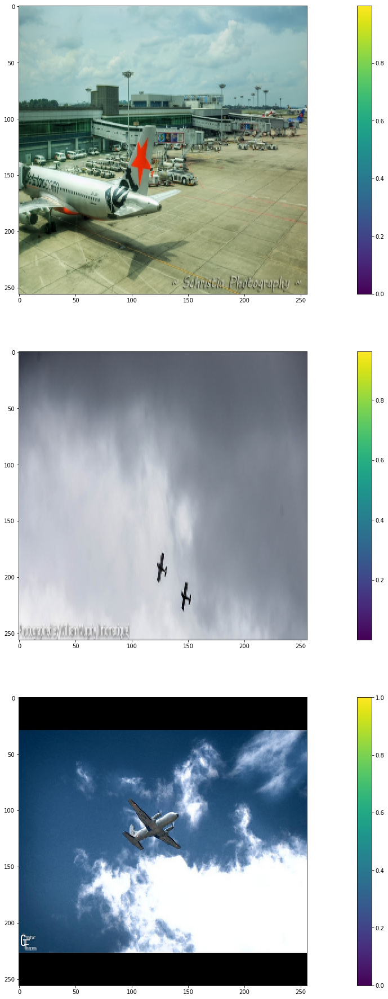

In [46]:
step_check(list(X_test), 3)

### Image Augmentation

In [47]:
from imgaug import augmenters as iaa

In [48]:
aug1 = iaa.Fliplr(1.0)
aug2 = iaa.Affine(scale = (1.15, 1.25), rotate= (-5, 5))
aug3 = iaa.Affine(scale = 1.1, translate_px={"x": (-16, 16), "y": (-4, 4)})
aug4 = iaa.GaussianBlur(sigma=(0.0, 1.0))
aug5 = iaa.Sharpen(alpha=(0.5, 1.0))

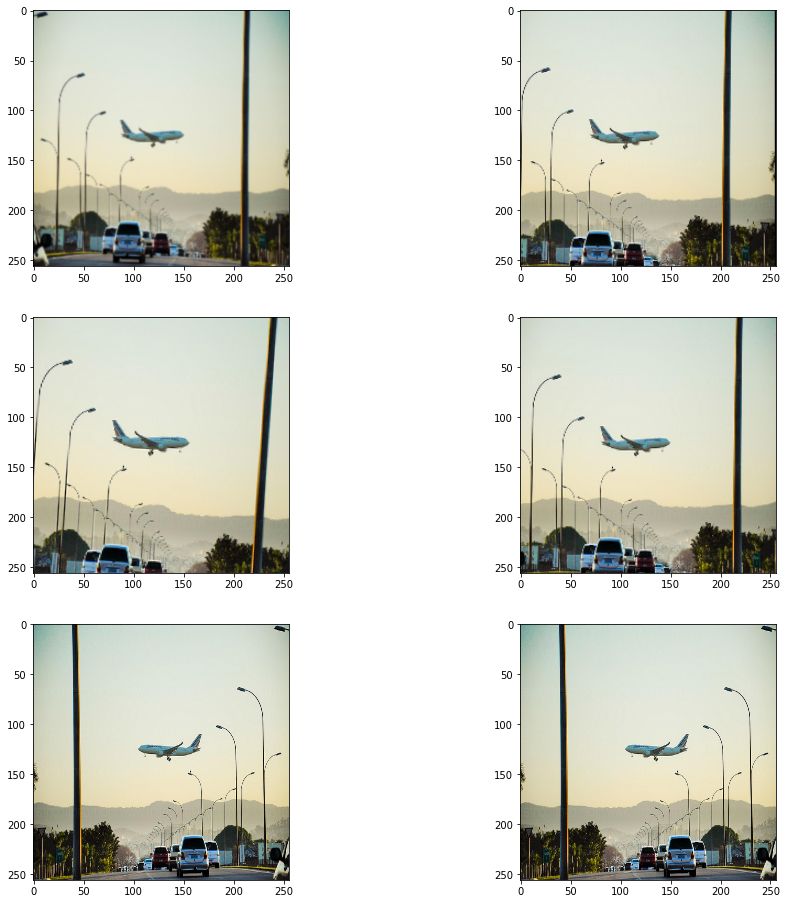

In [49]:
aug = iaa.OneOf([aug1, aug2, aug3, aug4, aug5])
fig = plt.figure(figsize=(16,16))
for i in range(6):
    fig.add_subplot(3, 2, i+1)
    plt.imshow(aug.augment_image(X_train[100]))
plt.show();

In [50]:
# Training generator, generates augmented images
def train_batch_generator(x, y, aug, batch_size = 32):
    # create empty arrays to contain batch of images and masks
    batch_images = np.zeros((batch_size, IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS))
    batch_masks = np.zeros((batch_size, IMG_WIDTH, IMG_HEIGHT, 1))
    while True:
        # Fill arrays of batch size with augmented data taken randomly from full passed arrays
        indexes = random.sample(range(len(x)), batch_size)
        # Perform the exactly the same augmentation for x and y
        for i in range(batch_size):
            j = indexes[i]
            batch_images[i] = aug.augment_image(x[j])
            batch_masks[i] = aug.augment_image(y[j])
        yield batch_images, batch_masks

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


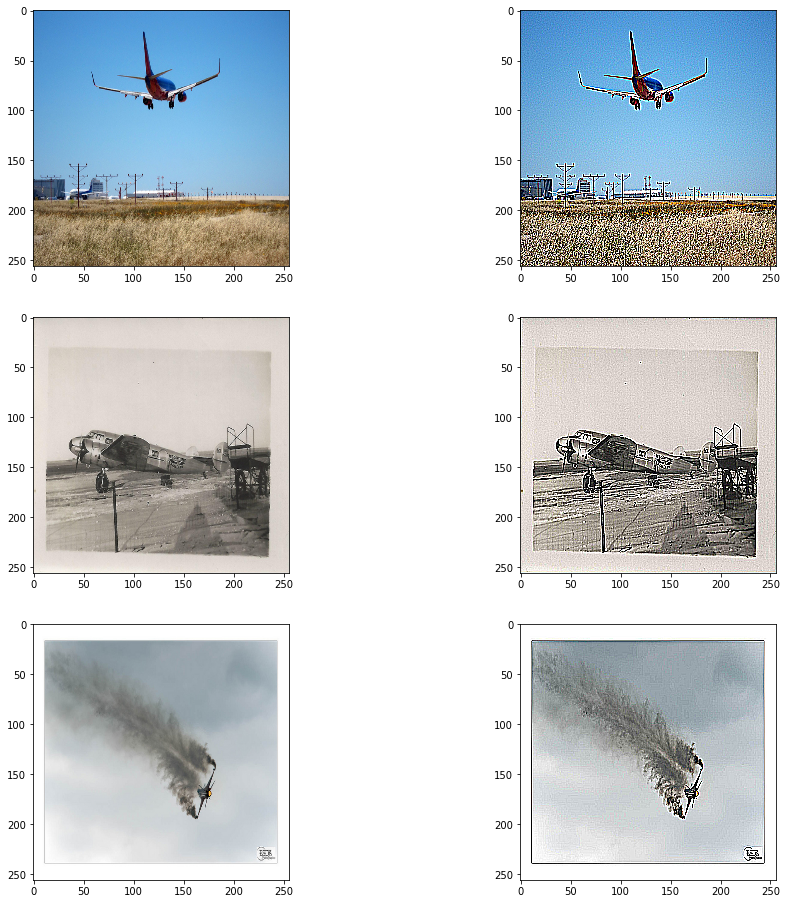

In [51]:
aug = iaa.OneOf([aug1, aug2, aug3, aug4, aug5])
aug_fixed = aug.to_deterministic()
fig = plt.figure(figsize=(16,16))
for i in range(1,4):
    fig.add_subplot(3, 2, 2*i - 1)
    plt.imshow(X_train[160+i])
    fig.add_subplot(3, 2, 2*i)
    plt.imshow(aug_fixed.augment_image(X_train[160+i]))
plt.show();

In [52]:
print(X_train.shape, Y_train.shape, X_test.shape, Y_test.shape)

(1497, 256, 256, 3) (1497, 256, 256, 1) (726, 256, 256, 3) (726, 256, 256, 1)


In [53]:
mask_aera = []
for m in Y_train:
    aera = np.count_nonzero(m)/65536
    mask_aera.append(aera)

In [54]:
np.percentile(mask_aera, (20,50,80))

array([0.0283844 , 0.10383606, 0.18625488])

In [ ]:
mask_aera = np.array(mask_aera)

mask_index = np.argwhere(mask_aera<0.03)
mask_index = mask_index.reshape(mask_index.shape[0])

X_new = X_train[mask_index]
Y_new = Y_train[mask_index]

X_new.shape,Y_new.shape

In [ ]:
def train_expand(aug, train_set):   
    return aug.augment_images(tqdm(train_set))

In [ ]:
a1 = aug1.to_deterministic()
a2 = aug2.to_deterministic()
a3 = aug2.to_deterministic()
a4 = aug3.to_deterministic()
a5 = aug3.to_deterministic()
a6 = aug4.to_deterministic()
a7 = aug5.to_deterministic()

a = [a1,a2,a3,a4,a5,a6,a7]
X_large = X_new
Y_large = Y_new

for augmentation in a:
    X_new_augmented = np.array(train_expand(augmentation, X_new))
    X_large = np.concatenate((X_large, X_new_augmented))
    Y_new_augmented = np.array(train_expand(augmentation, Y_new))
    Y_large = np.concatenate((Y_large, Y_new_augmented))

In [ ]:
X_large = 0 
Y_large = 0

In [ ]:
import dill

In [ ]:
dill.dump(X_large, open('data/X_large','wb'))
dill.dump(Y_large, open('data/Y_large','wb'))

### U-net Image Segmentation Model

In [55]:
os.environ['KERAS_BACKEND'] = 'tensorflow'

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization
from keras.layers.core import Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import backend as K
import keras.losses
import tensorflow as tf

from matplotlib.patches import Rectangle

from scipy.ndimage.measurements import label

import cv2 
import glob
import time

Using TensorFlow backend.


In [56]:
def mean_iou(y_true, y_pred):
    prec = []
    for t in np.arange(0.8, 1.0, 0.05):
        y_pred_ = tf.to_int32(y_pred > t)
        score, up_opt = tf.metrics.mean_iou(y_true, y_pred_, 2)
        K.get_session().run(tf.local_variables_initializer())
        with tf.control_dependencies([up_opt]):
            score = tf.identity(score)
        prec.append(score)
    return K.mean(K.stack(prec), axis=0)

def jaccard_distance_loss(y_true, y_pred, smooth=1):
    """
    Jaccard = (|X & Y|)/ (|X|+ |Y| - |X & Y|)
            = sum(|A*B|)/(sum(|A|)+sum(|B|)-sum(|A*B|))
    
    The jaccard distance loss is usefull for unbalanced datasets. This has been
    shifted so it converges on 0 and is smoothed to avoid exploding or disapearing
    gradient.
    
    Ref: https://en.wikipedia.org/wiki/Jaccard_index
    
    @url: https://gist.github.com/wassname/f1452b748efcbeb4cb9b1d059dce6f96
    @author: wassname
    """
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    sum_ = K.sum(K.abs(y_true) + K.abs(y_pred), axis=-1)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return (1 - jac) * 10000

In [57]:
### IOU or dice coeff calculation

def IOU_calc(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)

    return (2 * (intersection + 1)) / (K.sum(y_true_f) + K.sum(y_pred_f) + 1)


def IOU_calc_loss(y_true, y_pred):
    return 1 - IOU_calc(y_true, y_pred)

In [58]:
keras.losses.jaccard_distance_loss = jaccard_distance_loss
keras.losses.IOU_calc_loss = IOU_calc_loss

In [59]:
# Build U-Net model
inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
s = Lambda(lambda x: x / 255) (inputs)

c1 = BatchNormalization() (inputs)
c1 = Conv2D(64, (3, 3), activation='relu', padding='same') (c1)
c1 = BatchNormalization() (c1)
c1 = Conv2D(64, (3, 3), activation='relu', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = BatchNormalization() (p1)
c2 = Conv2D(64, (3, 3), activation='relu', padding='same') (c2)
c2 = BatchNormalization() (c2)
c2 = Conv2D(64, (3, 3), activation='relu', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = BatchNormalization() (p2)
c3 = Conv2D(64, (3, 3), activation='relu', padding='same') (c3)
c3 = BatchNormalization() (c3)
c3 = Conv2D(64, (3, 3), activation='relu', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = BatchNormalization() (p3)
c4 = Conv2D(128, (3, 3), activation='relu', padding='same') (c4)
c4 = BatchNormalization() (c4)
c4 = Conv2D(128, (3, 3), activation='relu', padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c5 = BatchNormalization() (p4)
c5 = Conv2D(256, (3, 3), activation='relu', padding='same') (c5)
c5 = BatchNormalization() (c5)
c5 = Conv2D(256, (3, 3), activation='relu', padding='same') (c5)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = BatchNormalization() (u6)
c6 = Conv2D(128, (3, 3), activation='relu', padding='same') (c6)
c6 = BatchNormalization() (c6)
c6 = Conv2D(128, (3, 3), activation='relu', padding='same') (c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = BatchNormalization() (u7)
c7 = Conv2D(64, (3, 3), activation='relu', padding='same') (c7)
c7 = BatchNormalization() (c7)
c7 = Conv2D(64, (3, 3), activation='relu', padding='same') (c7)

u8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = BatchNormalization() (u8)
c8 = Conv2D(64, (3, 3), activation='relu', padding='same') (c8)
c8 = BatchNormalization() (c8)
c8 = Conv2D(64, (3, 3), activation='relu', padding='same') (c8)

u9 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = BatchNormalization() (u9)
c9 = Conv2D(64, (3, 3), activation='relu', padding='same') (c9)
c9 = BatchNormalization() (c9)
c9 = Conv2D(64, (3, 3), activation='relu', padding='same') (c9)
# c9 = BatchNormalization() (c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

smooth = 1
model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='IOU_calc_loss', metrics=[IOU_calc])
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 256, 256, 3)  12          input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 64) 1792        batch_normalization_1[0][0]      
__________________________________________________________________________________________________
batch_normalization_2 (BatchNor (None, 256, 256, 64) 256         conv2d_1[0][0]                   
__________________________________________________________________________________________________
conv2d_2 (

In [73]:
### Using previously trained data. Set load_pretrained = False, increase epochs and train for full training.
load_pretrained = True
if load_pretrained == True:
    model.load_weights('model/model-aircraft-detection(IOU).h5')

In [61]:
# Fit model
earlystopper = EarlyStopping(patience=5, 
                             verbose=1)
checkpointer = ModelCheckpoint('model/model-aircraft-detection(test).h5', 
                               verbose=1, 
                               save_best_only=True)

results = model.fit(
                    X_train, 
                    Y_train, 
                    validation_split = 0.1, 
                    batch_size = 16, 
                    epochs = 1, 
                    callbacks=[earlystopper, checkpointer]
                   )

Train on 1347 samples, validate on 150 samples
Epoch 1/1
1347/1347 [==============================] - 1168s 867ms/step - loss: 0.0777 - IOU_calc: 0.9223 - val_loss: 0.1635 - val_IOU_calc: 0.8365

Epoch 00001: val_loss improved from inf to 0.16352, saving model to model/model-aircraft-detection(test).h5


In [62]:
model.save('model-aircraft-detection.h5')

In [ ]:
# Train on augmented images 
model.load_weights('model-aircraft-detection.h5')
aug = iaa.OneOf([aug1, aug2, aug3, aug4, aug5]).to_deterministic()
bs = 16

history = model.fit_generator(
                              generator = train_batch_generator(X_train, Y_train, aug, batch_size = bs),
                              steps_per_epoch= len(X_train) // bs, 
                              epochs=1, 
                              verbose = 1, 
                              workers = -1,  
                              callbacks=[earlystopper, checkpointer]
                             )    

### Evaluate IOU on the test set

In [84]:
Y_pred = model.predict(X_test, verbose=1)
Y_true = Y_test

726/726 [==============================] - 67s 92ms/step


In [ ]:
# dill.dump(Y_pred, open('data/Y_pred.sav','wb'))

In [87]:
model.evaluate(X_test, Y_test)

726/726 [==============================] - 67s 92ms/step


[0.15724502713227076, 0.8427549728677293]

(array([64093.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,  1443.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

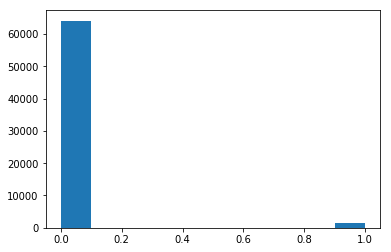

In [88]:
plt.hist((Y_pred[1].flatten() > 0.9).astype(int))

In [89]:
IOU = []
for i in tqdm(range(len(Y_true))):
    pred = (Y_pred[i] > 0.9).astype(int)
    intersection = np.logical_and(Y_true[i], pred).sum()
    union = np.logical_or(Y_true[i], pred).sum()
    IOU.append(intersection/union)

100%|██████████| 726/726 [00:00<00:00, 1851.08it/s]


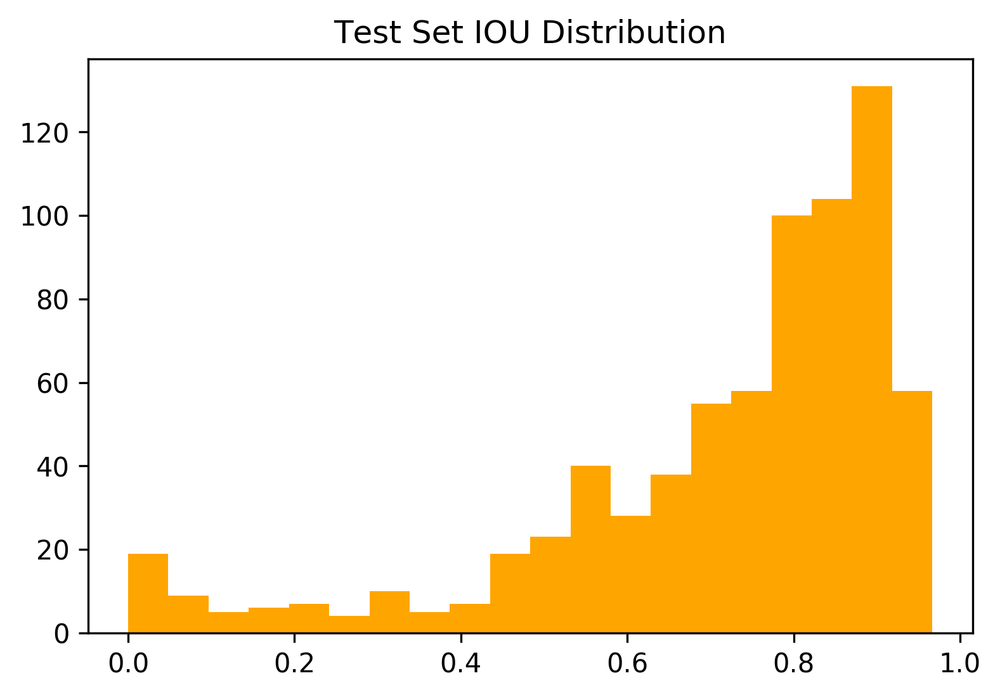

In [90]:
plt.figure(dpi=300)
plt.hist(IOU, bins=20, color='orange')
plt.title('Test Set IOU Distribution');

### Resize back to high definition images

In [91]:
Y_pred_org = []

for i in tqdm(range(len(test_masks))):
    temp = resize(Y_pred[i], test_masks[i].shape, mode = 'constant')
    try:
        temp = temp > threshold_minimum(temp)
    except:
        temp = temp > 0.5
    Y_pred_org.append(temp.astype(int))

Y_true_org = test_masks

100%|██████████| 726/726 [00:47<00:00, 15.20it/s]


### Test

[467, 340, 250, 597, 600, 186, 424, 56, 253, 555]


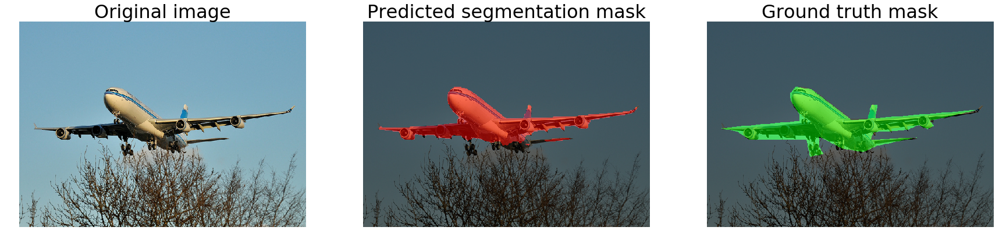

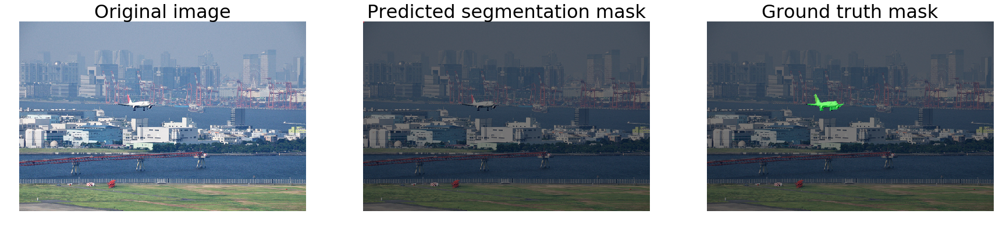

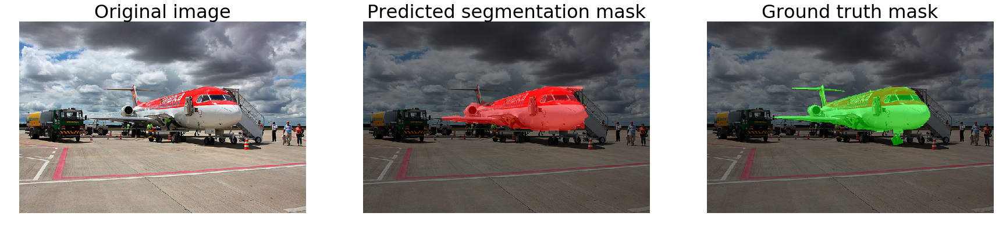

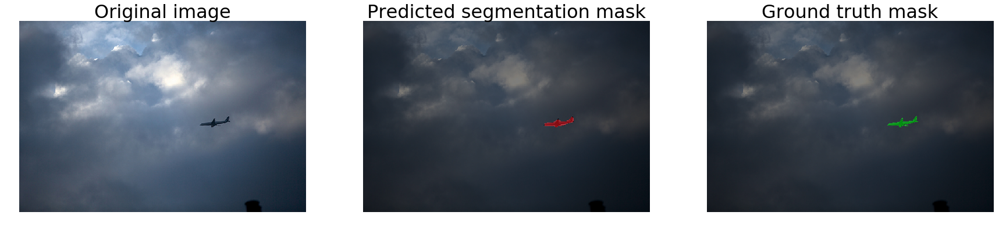

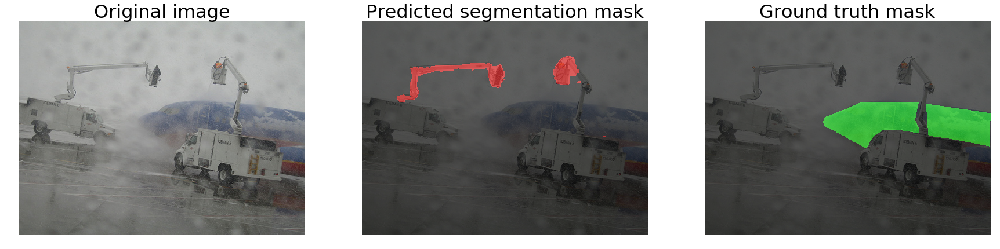

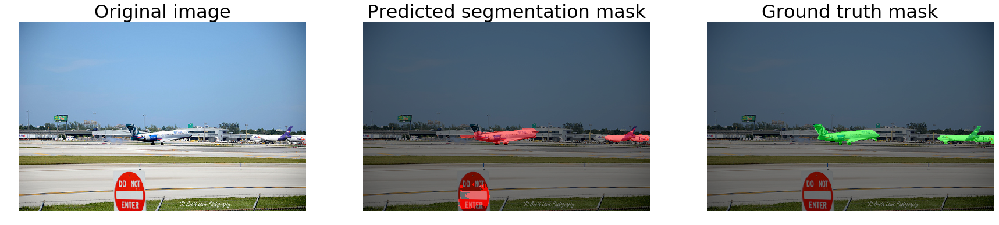

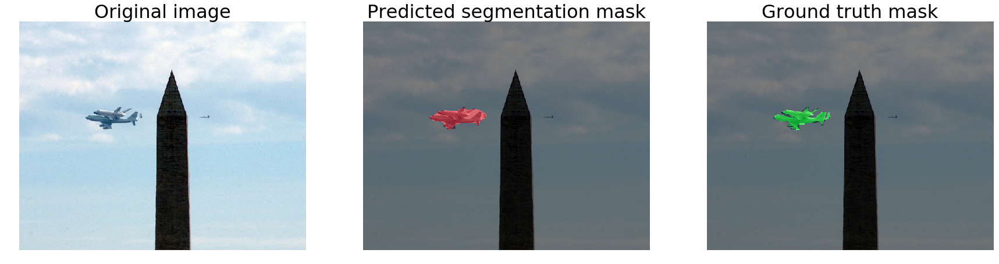

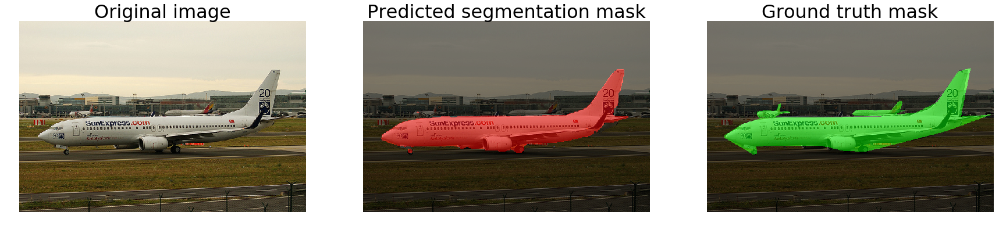

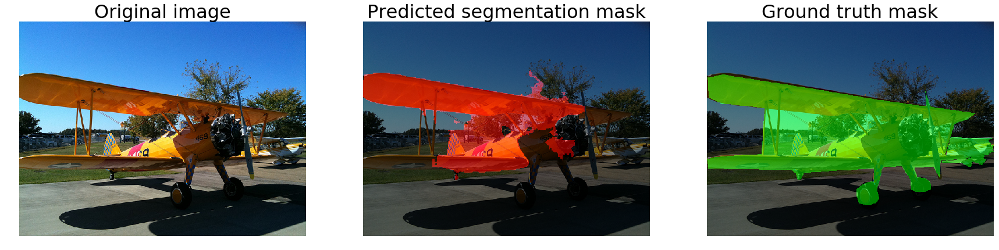

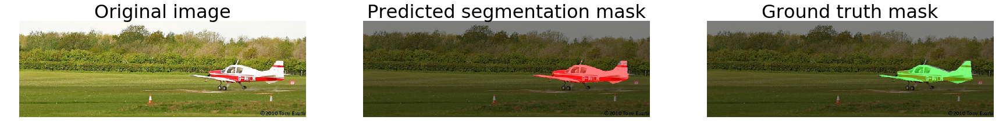

In [149]:
# Test on a sample of test set

f = 32
sample_size = 10
sample_idx = random.sample(range(len(test_images)), sample_size)
print(sample_idx)

for idx in sample_idx:
      
    im = np.array(test_images[idx],dtype=np.uint8)
    im_mask = np.array(255 * Y_true_org[idx],dtype=np.uint8)
    im_pred = np.array(255 * Y_pred_org[idx],dtype=np.uint8)
    
    rgb_mask_pred = cv2.cvtColor(im_pred,cv2.COLOR_GRAY2RGB)
    rgb_mask_pred[:,:,1:3] = 0*rgb_mask_pred[:,:,1:2]
    rgb_mask_true= cv2.cvtColor(im_mask,cv2.COLOR_GRAY2RGB)
    rgb_mask_true[:,:,0] = 0*rgb_mask_true[:,:,0]
    rgb_mask_true[:,:,2] = 0*rgb_mask_true[:,:,2]
    
    img_pred = cv2.addWeighted(rgb_mask_pred,0.5,im,0.5,0)
    img_true = cv2.addWeighted(rgb_mask_true,0.5,im,0.5,0)
    
    plt.figure(figsize=(30,30))
    plt.subplot(1,3,1)
    plt.imshow(im)
    plt.title('Original image', fontsize=f)
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(img_pred)
    plt.title('Predicted segmentation mask', fontsize=f)
    plt.axis('off')
    plt.subplot(1,3,3)
    plt.imshow(img_true)
    plt.title('Ground truth mask', fontsize=f)
    plt.axis('off')
    plt.show()

### Draw Bounding Boxes

In [127]:
#### Function for drawing bounding boxes, taken from Ryan's code on Udacity

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected aircrafts
    for aircraft_number in range(1, labels[1]+1):
        # Find pixels with each aircraft_number label value
        nonzero = (labels[0] == aircraft_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        if (np.max(nonzeroy)-np.min(nonzeroy)) * (np.max(nonzerox)-np.min(nonzerox)) >= 200:
            bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
            # Draw the box on the image       
            cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 3)
    # Return the image
    return img

def test_new_img(img):
    img = resize(img,(IMG_HEIGHT, IMG_WIDTH), mode='constant')
    img = np.reshape(img,(1,IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    pred = model.predict(img)
    return pred,img[0]

def get_BB_new_img(img):
    
    # Take in RGB image
    pred,img = test_new_img(img)
    img  = np.array(255*img,dtype= np.uint8)
    img_pred = np.array(255*pred[0],dtype=np.uint8)
    heatmap = img_pred[:,:,0]
    
    # Use Scipy label function to segregate each individual aircraft in the predicted mask
    labels = label(heatmap) # returns a tuple of (labeled array, number of features)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

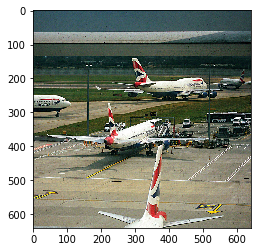

In [128]:
plt.imshow(test_images[127]);

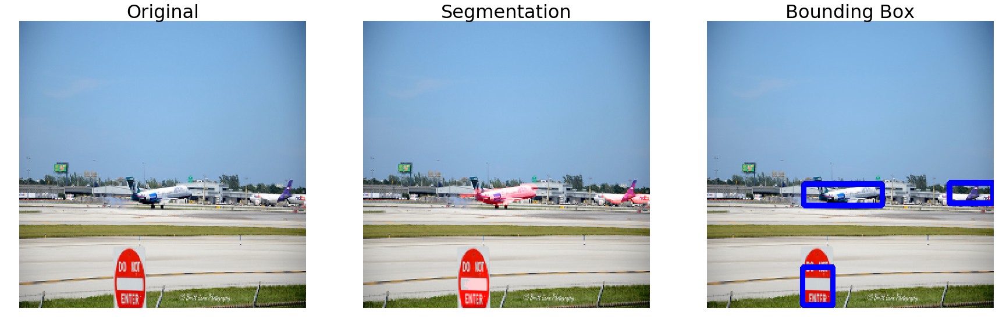

In [150]:
f = 32

img_1 = test_images[186]
pred,im = test_new_img(img_1)
im  = np.array(255*im,dtype= np.uint8)
im_pred = np.array(255*pred[0],dtype=np.uint8)
rgb_mask_pred = cv2.cvtColor(im_pred,cv2.COLOR_GRAY2RGB)
rgb_mask_pred[:,:,1:3] = 0*rgb_mask_pred[:,:,1:2]



img_pred = cv2.addWeighted(rgb_mask_pred,0.5,im,1,0)


draw_img = get_BB_new_img(im)

plt.figure(figsize=(30,30))
plt.subplot(1,3,1)
plt.imshow(im)
plt.title('Original', fontsize=f)
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(img_pred)
plt.title('Segmentation', fontsize=f)
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(draw_img)
plt.title('Bounding Box', fontsize=f)
plt.axis('off');